In [13]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered.h5ad')

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


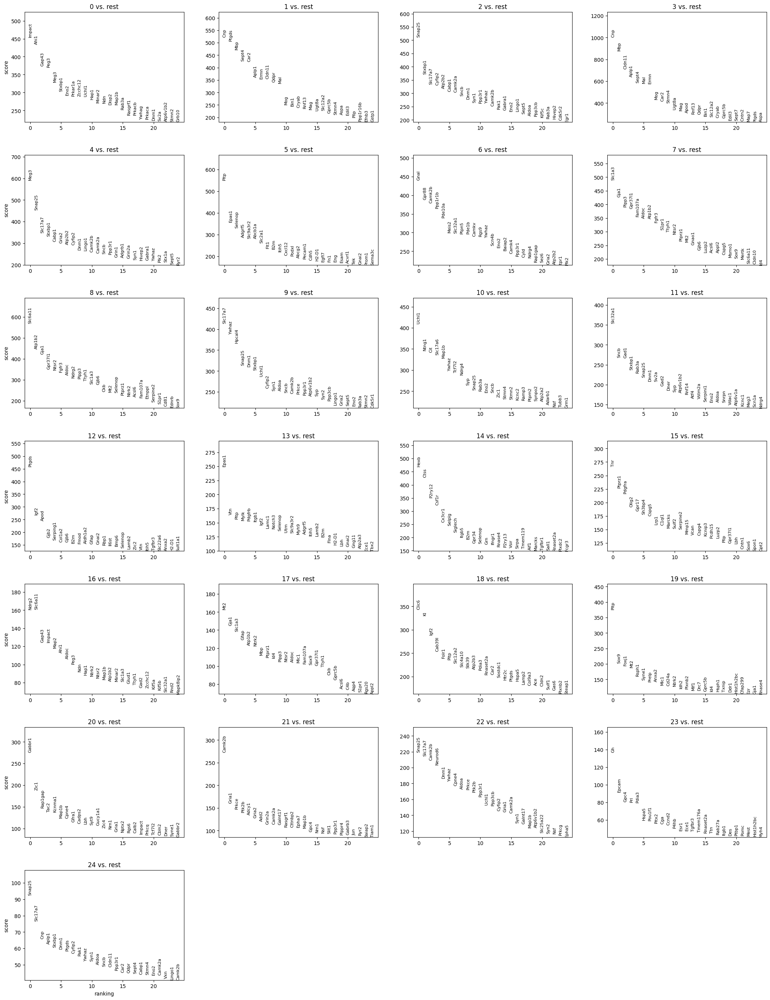

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Impact,454.347900,2.176929,0.0,0.0
1,0,Ahi1,434.879120,2.819650,0.0,0.0
2,0,Gap43,373.857452,2.033056,0.0,0.0
3,0,Peg3,371.329590,2.229858,0.0,0.0
4,0,Meg3,329.643555,2.010380,0.0,0.0


In [14]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(adata, groupby="leiden_1", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(adata, group=None)
markers.head()

In [32]:
marker_genes = pd.DataFrame({
    group: adata.uns['rank_genes_groups']['names'][group][:5]
    for group in adata.uns['rank_genes_groups']['names'].dtype.names
})


In [33]:
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

0
Impact Ahi1 Gap43 Peg3 Meg3
 
1
Cnp Ptgds Mbp Sept4 Car2
 
2
Snap25 Stxbp1 Slc17a7 Cyfip2 Atp2b2
 
3
Cnp Mbp Cldn11 Aplp1 Sept4
 
4
Meg3 Snap25 Slc17a7 Stxbp1 Cabp1
 
5
Pltp Epas1 Selenop Adgrf5 Slc9a3r2
 
6
Gnal Gpr88 Camk2b Ppp1r1b Pde10a
 
7
Slc1a3 Gja1 Plpp3 Gpr37l1 Fam107a
 
8
Slc6a11 Atp1b2 Gja1 Gpr37l1 Ntsr2
 
9
Slc17a7 Ywhaz Hpcal4 Snap25 Dnm1
 
10
Uchl1 Ntng1 Cit Slc17a6 Map1b
 
11
Slc32a1 Sncb Gad1 Stxbp1 Rab3a
 
12
Ptgds Igf2 Apod Gjb2 Serping1
 
13
Epas1 Vtn Pltp Mylk Pdgfrb
 
14
Hexb Ctss P2ry12 Csf1r Cx3cr1
 
15
Tnr Ptprz1 Pdgfra Olig2 Gpr17
 
16
Ndrg2 Slc6a11 Gap43 Impact Map2
 
17
Mt2 Gja1 Slc1a3 Gfap Atp1b2
 
18
Clic6 Kl Igf2 Cab39l Folr1
 
19
Pltp Sox9 Foxj1 Mt2 Rsph1
 
20
Gabbr1 Zic1 Rap1gap Tac2 Kcnma1
 
21
Camk2b Gria1 Prkce Ptk2b Adcy1
 
22
Snap25 Slc17a7 Camk2b Neurod6 Dnm1
 
23
Gh Epcam Gpc4 Prl Pdia3
 
24
Snap25 Slc17a7 Cnp Aplp1 Stxbp1
 


In [16]:
from mllmcelltype import annotate_clusters, setup_logging

In [17]:
from dotenv import load_dotenv
import os

load_dotenv()  # will read .env into environment
api_key = os.getenv("../OPENAI_API_KEY")

In [18]:
marker_genes = marker_genes.T

In [19]:
marker_genes = marker_genes.reset_index().rename(columns={'index':'cluster'})

In [20]:
marker_genes = marker_genes.set_index("cluster").T.to_dict("list")

In [21]:
import os

# Annotate clusters with a single model
annotations = annotate_clusters(
    marker_genes=marker_genes,  # DataFrame or dictionary of marker genes
    species='mouse',               # Organism species
    provider='openai',            # LLM provider
    model='gpt-4o-mini',               # Specific model
    tissue='brain'                #Tissue context (optional but recommended)
)

# Print annotations
for cluster, annotation in annotations.items():
    print(f"Cluster {cluster}: {annotation}")

2025-09-23 14:17:07 - llmcelltype - INFO - Logging initialized. Log file: /Users/christoffer/.llmcelltype/logs/llmcelltype_20250923_141707.log
2025-09-23 14:17:07 - llmcelltype - INFO - Starting annotation with provider: openai
2025-09-23 14:17:07 - llmcelltype - INFO - Found 25 clusters
2025-09-23 14:17:07 - llmcelltype - INFO - Creating prompt for 25 clusters
2025-09-23 14:17:07 - llmcelltype - INFO - Generated prompt with 1774 characters
2025-09-23 14:17:07 - llmcelltype - INFO - Loaded results from cache (version 1.0): /Users/christoffer/.llmcelltype/cache/c9f43941708d472bfc1215a64c7afa1b.json
2025-09-23 14:17:07 - llmcelltype - INFO - Using cached results
2025-09-23 14:17:07 - llmcelltype - INFO - Successfully parsed response in 'Cluster X: Annotation' format


Cluster 0: Neurons
Cluster 1: Oligodendrocytes
Cluster 2: Excitatory Neurons
Cluster 3: Oligodendrocytes
Cluster 4: Excitatory Neurons
Cluster 5: Endothelial Cells
Cluster 6: Medium Spiny Neurons
Cluster 7: Astrocytes
Cluster 8: Astrocytes
Cluster 9: Excitatory Neurons
Cluster 10: Interneurons
Cluster 11: Inhibitory Neurons
Cluster 12: Microglia
Cluster 13: Endothelial Cells
Cluster 14: Microglia
Cluster 15: Oligodendrocyte Precursor Cells
Cluster 16: Neurons
Cluster 17: Astrocytes
Cluster 18: Endothelial Cells
Cluster 19: Ependymal Cells
Cluster 20: Interneurons
Cluster 21: Excitatory Neurons
Cluster 22: Excitatory Neurons
Cluster 23: Pituitary Cells
Cluster 24: Oligodendrocytes


In [22]:
adata.obs['cell_class'] = adata.obs['leiden_1'].map(annotations)

... storing 'cell_class' as categorical


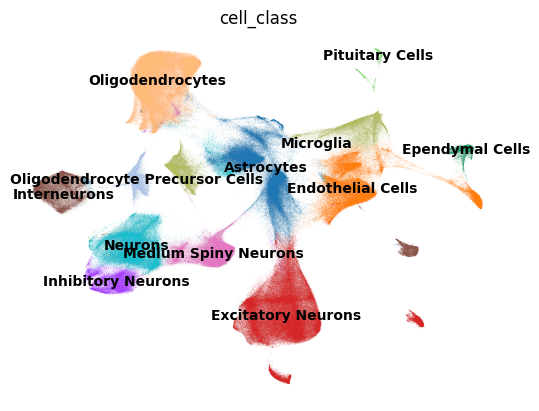

In [23]:
sc.pl.umap(adata, color='cell_class', legend_loc='on data', frameon=False)

In [24]:
spatial = np.array(adata.obs[['x_centroid','y_centroid']])
adata.obsm['spatial'] = spatial

output-XETG00045__0060539__RB4282__20250917__105852


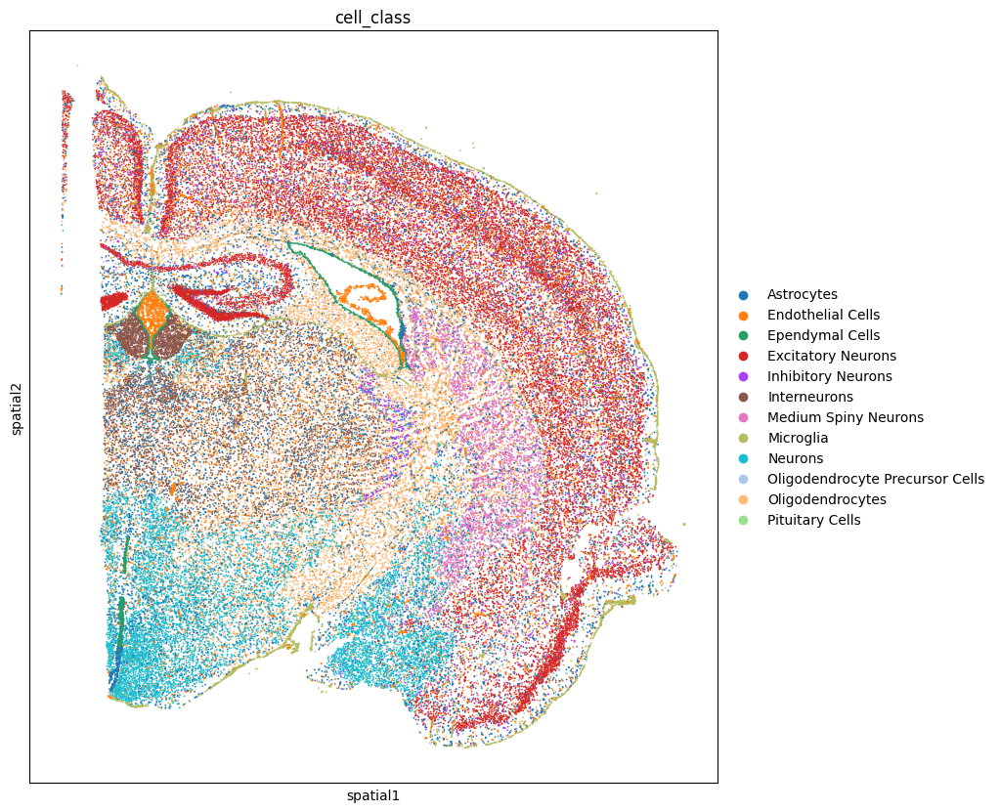

output-XETG00045__0060539__RB4350__20250917__105852


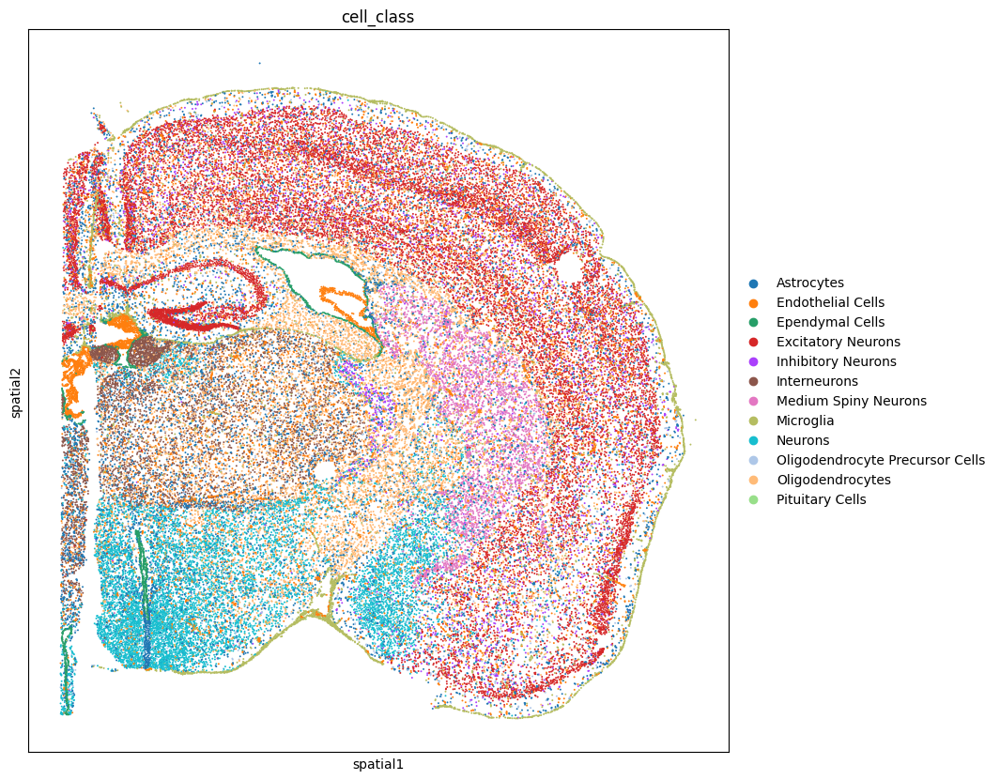

output-XETG00045__0060539__RB4401__20250917__105852


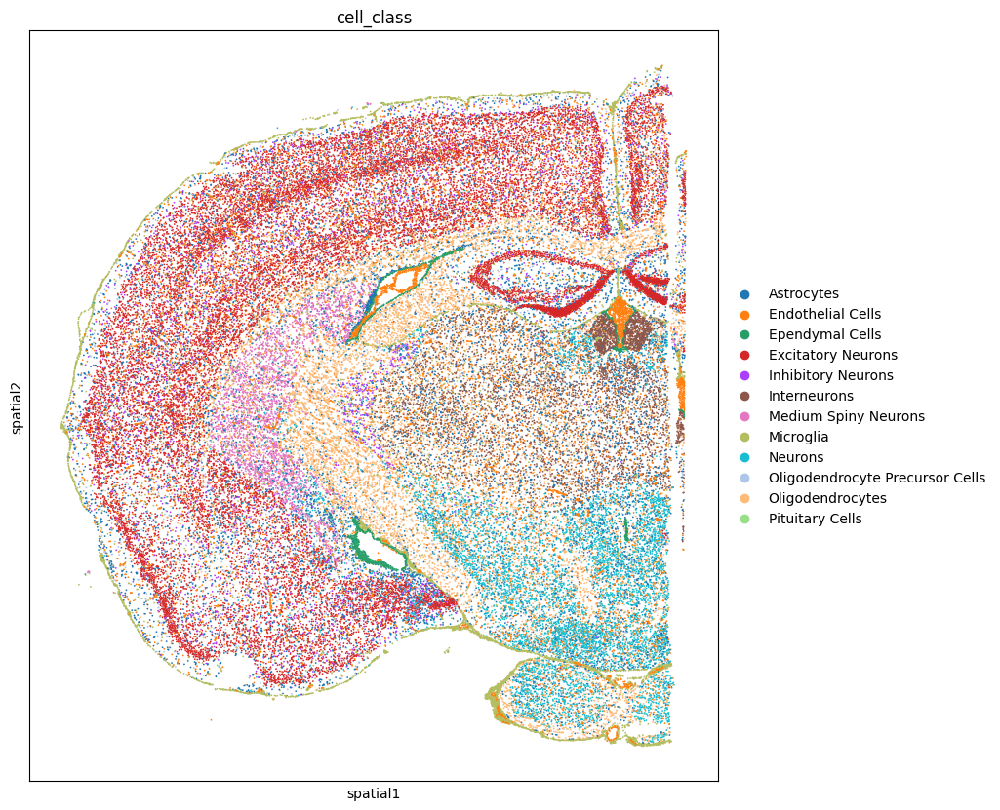

output-XETG00045__0060539__RB4403__20250917__105852


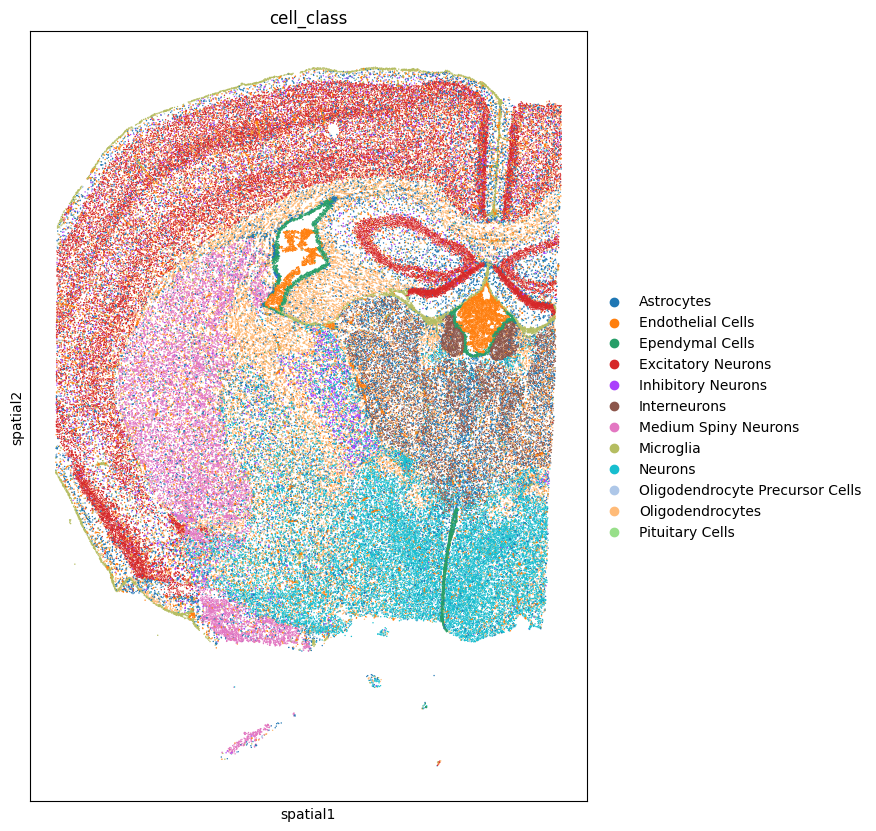

output-XETG00045__0060539__RB4405__20250917__105852


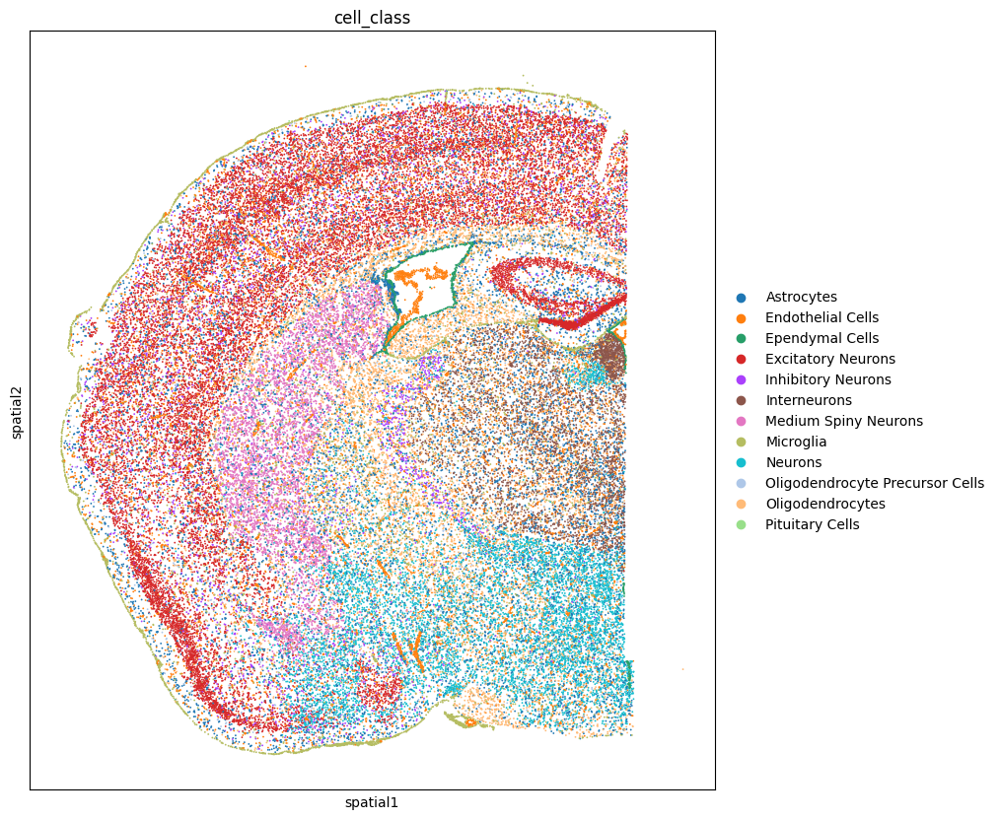

output-XETG00045__0060539__RB4498__20250917__105852


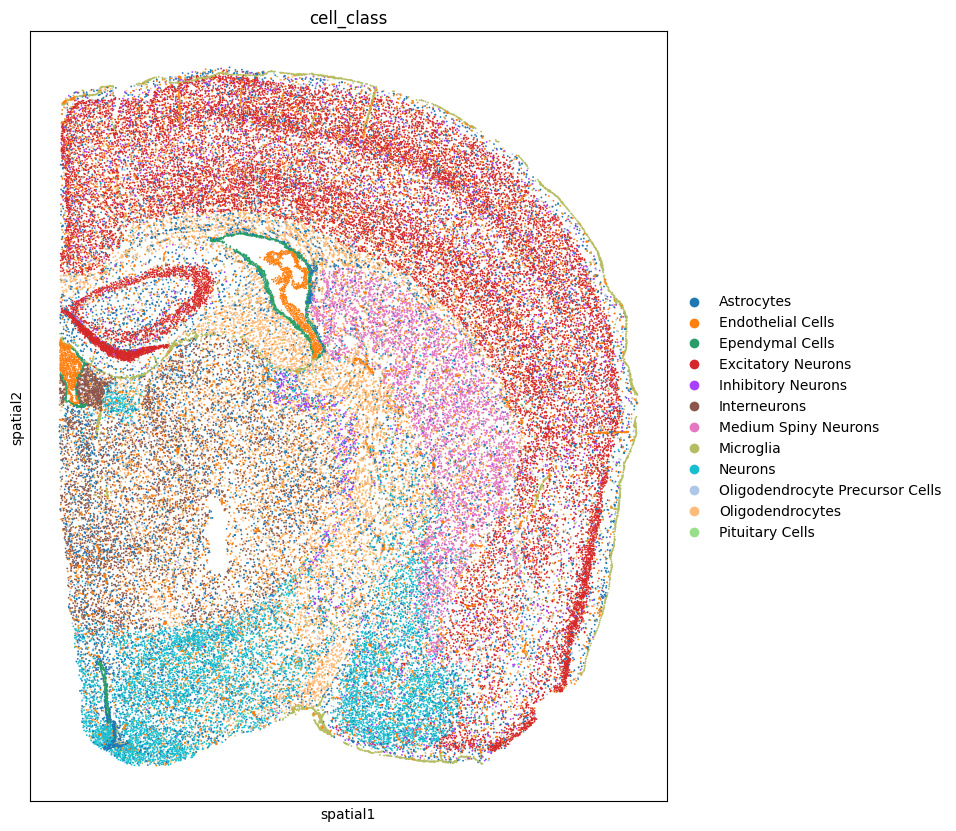

output-XETG00045__0060541__RB4620__20250917__105852


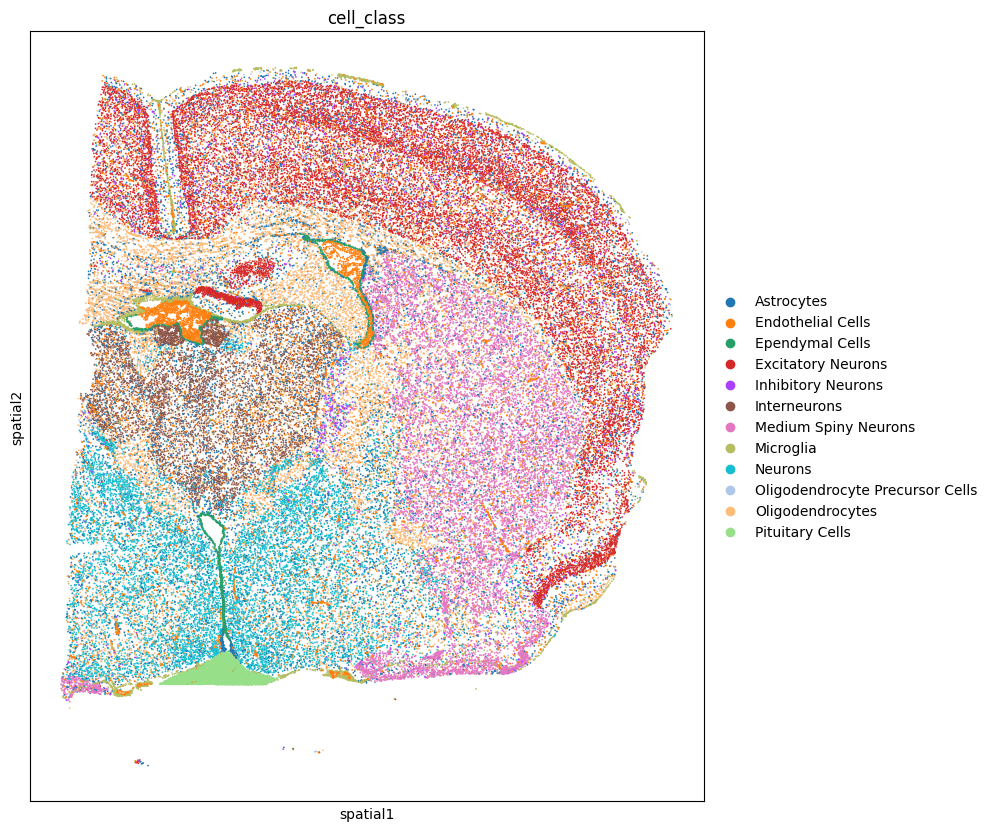

output-XETG00045__0060541__RB4627__20250917__105852


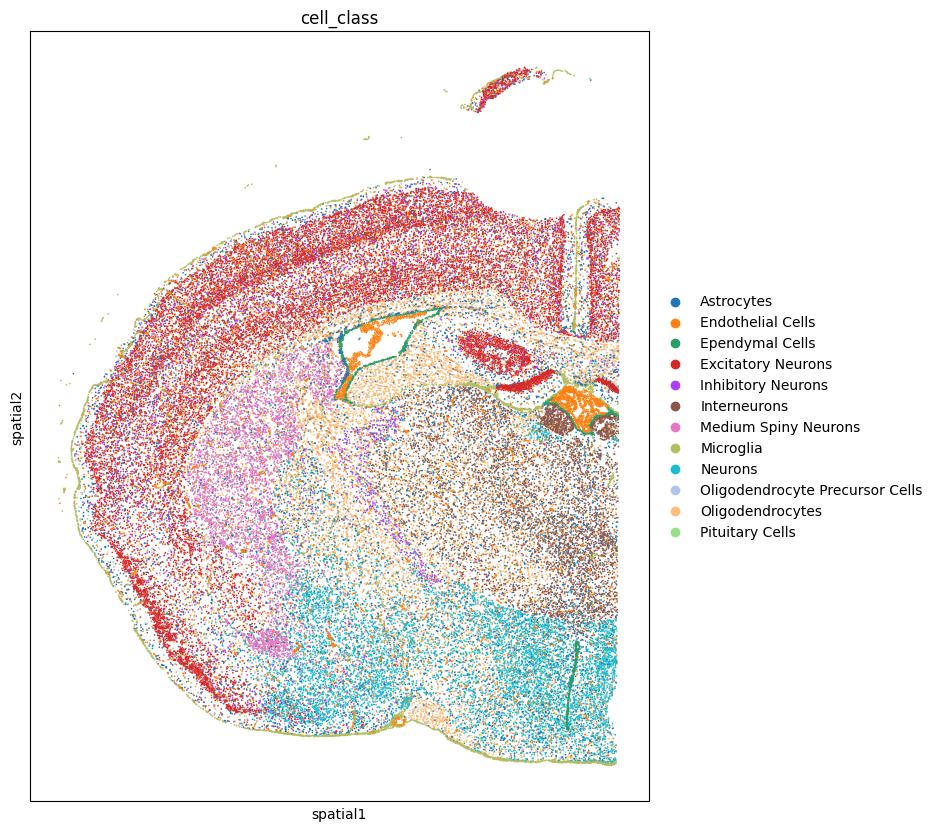

output-XETG00045__0060541__RB4630__20250917__105852


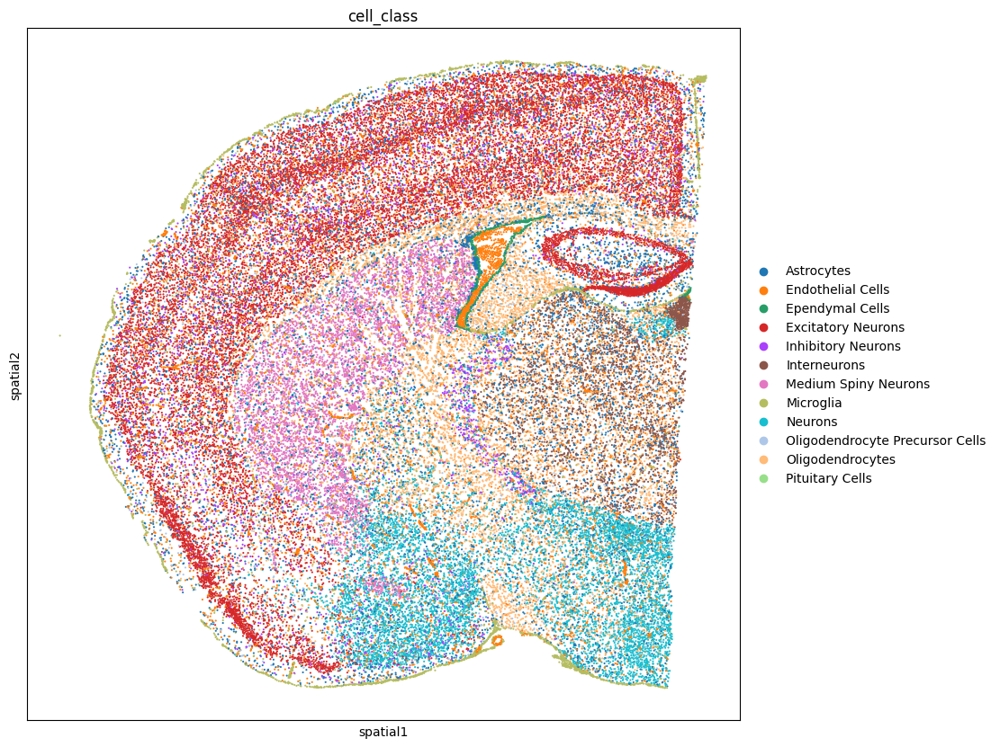

output-XETG00045__0060541__RB4653__20250917__105852


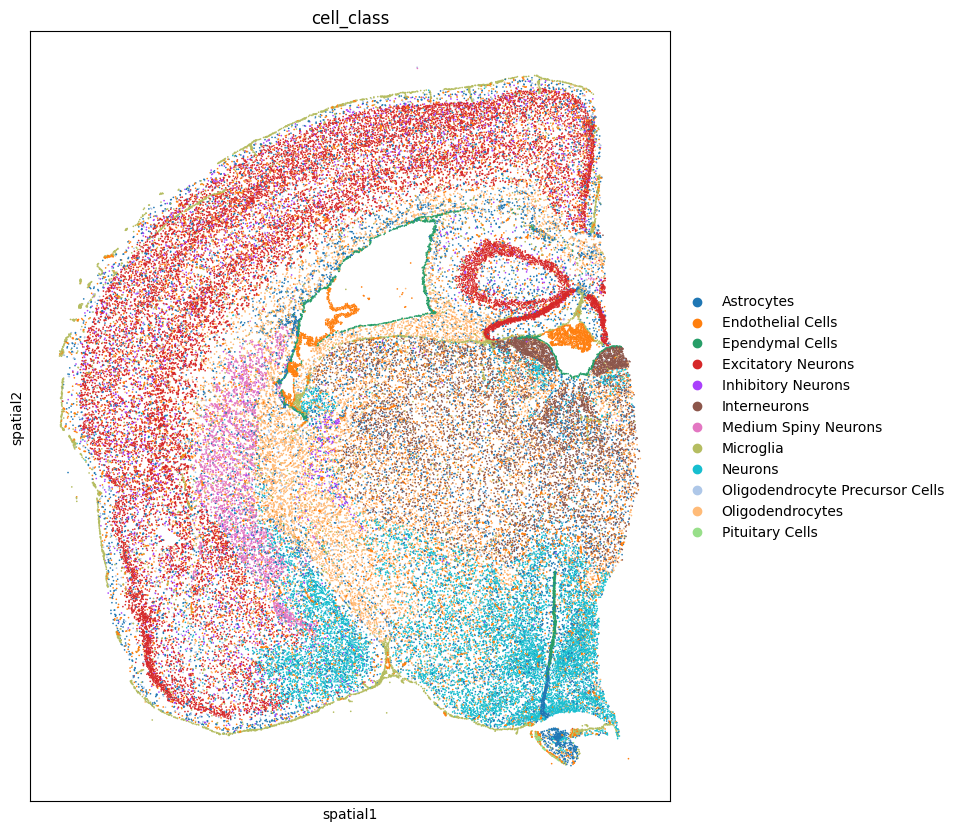

output-XETG00045__0060541__RB4658__20250917__105852


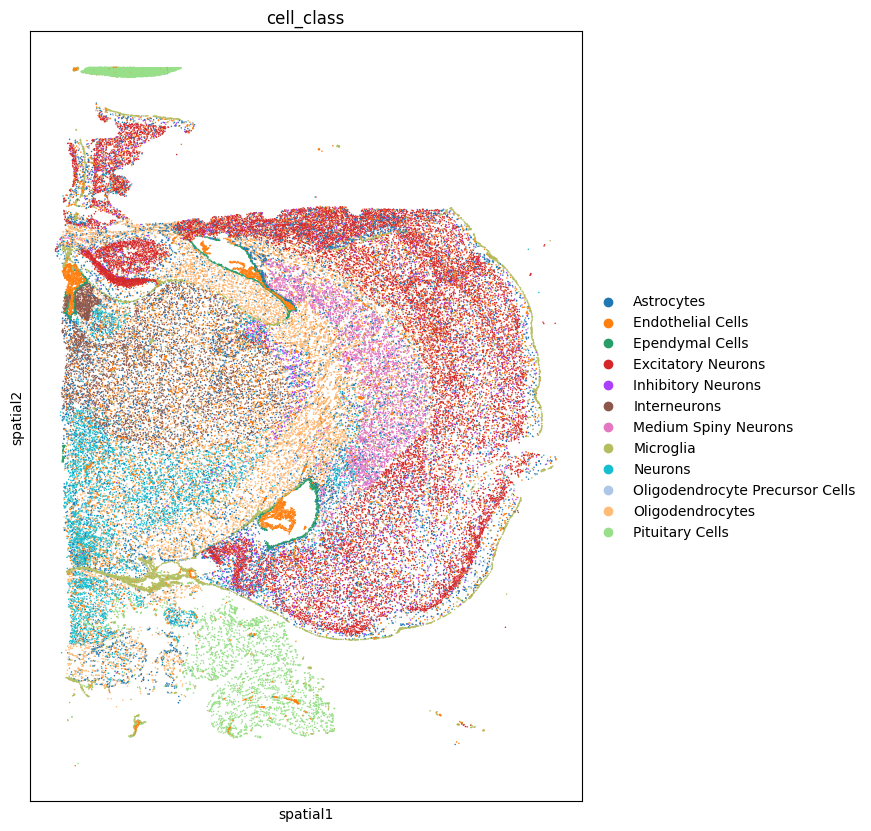

output-XETG00045__0060541__RB4676__20250917__105852


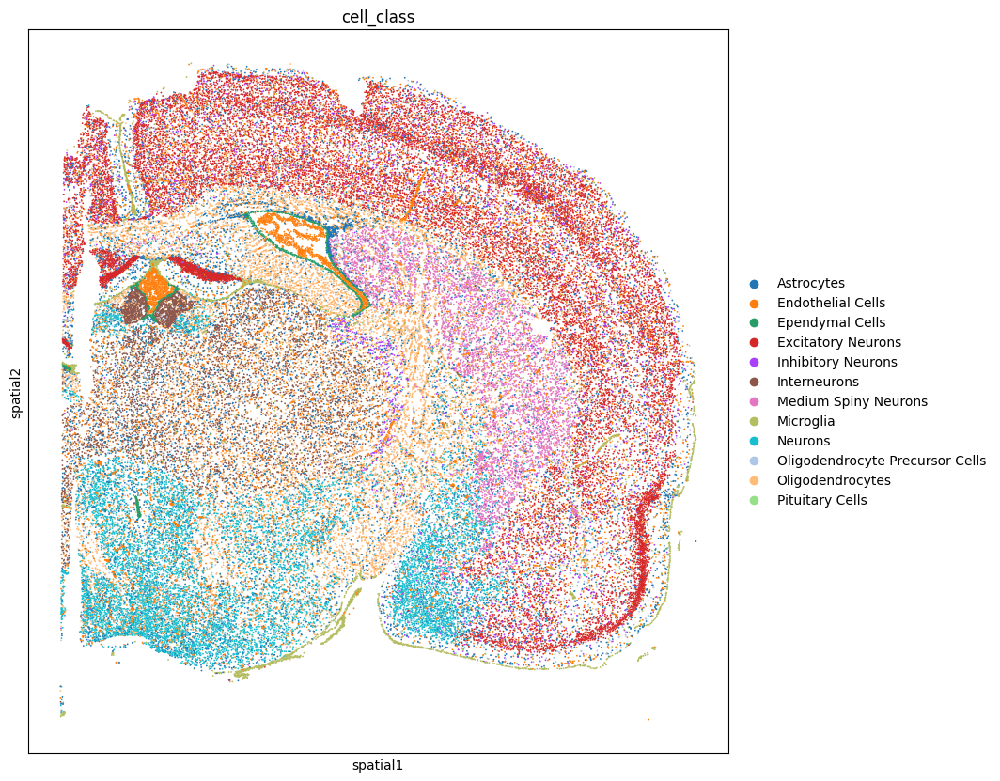

In [25]:
for run in adata.obs['run'].unique():
    print(run)
    ad_int = adata[adata.obs['run'] == run]
    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=15, color = 'cell_class')
    plt.show()
    